In [1]:
import os
import orjson as json
from mp_api.client import MPRester
import pickle
from pymatgen.core import Structure
import sys

sys.path.append("../../../")
from utils.save_and_load import save_to_json, load_from_json
%cd ../../raw_data/private/am_cm/

/home/xormap/sync/obs/7/research/mof/shg_ml/data/raw_data/private/am_cm


/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [ ]:
to_download = False
if to_download:
    with MPRester(os.environ["MP_API_KEY"]) as mpr:
        doc = mpr.materials.provenance.get_data_by_id(
            "mp-19770", fields=["database_IDs", "references"]
        )
    print(doc.database_IDs["icsd"])


In [3]:
abinit_filepath = "../../public/shg_abinit.json"
with open(abinit_filepath) as f:
    shg_abinit = json.loads(f.read())

with open("new_c/am.json") as f:
    shg_am = json.loads(f.read())

with open("new_c/cm.json") as f:
    shg_cm = json.loads(f.read())

In [4]:
shg_abinit_ids_filepath = "../../public/shg_abinit_ids.json"
shg_abinit_ids = {}

In [5]:
if to_download:
    for k, v in shg_abinit.items():
        with MPRester(os.environ["MP_API_KEY"]) as mpr:
            doc = mpr.materials.provenance.get_data_by_id(k, fields=["database_IDs"])
            if "ccdc" in doc.database_IDs:
                print("ccdc", doc.database_IDs["ccdc"])
            else:
                print(doc.database_IDs)
            if "icsd" in doc.database_IDs:
                shg_abinit_ids[k] = doc.database_IDs["icsd"]
    save_to_json(shg_abinit_ids, shg_abinit_ids_filepath)

In [6]:
shg_abinit_ids = load_from_json(shg_abinit_ids_filepath)

In [7]:
map_id_to_mpid = {}
for k, v in shg_abinit_ids.items():
    for idx in v:
        map_id_to_mpid[idx] = k
map_id_to_mpid

{'icsd-100292': 'mp-9791',
 'icsd-611332': 'mp-9791',
 'icsd-240875': 'mp-17066',
 'icsd-56552': 'mp-22925',
 'icsd-52361': 'mp-22925',
 'icsd-61542': 'mp-22925',
 'icsd-164965': 'mp-22925',
 'icsd-161579': 'mp-22925',
 'icsd-164960': 'mp-22925',
 'icsd-164964': 'mp-22925',
 'icsd-164959': 'mp-22925',
 'icsd-53851': 'mp-22925',
 'icsd-164961': 'mp-22925',
 'icsd-164963': 'mp-22925',
 'icsd-195588': 'mp-18463',
 'icsd-71778': 'mp-18463',
 'icsd-74306': 'mp-632229',
 'icsd-27055': 'mp-632229',
 'icsd-74307': 'mp-632229',
 'icsd-34106': 'mp-6015',
 'icsd-26411': 'mp-6015',
 'icsd-71579': 'mp-8943',
 'icsd-1412': 'mp-20694',
 'icsd-20031': 'mp-7688',
 'icsd-61256': 'mp-556717',
 'icsd-79703': 'mp-6257',
 'icsd-80422': 'mp-6257',
 'icsd-150371': 'mp-3589',
 'icsd-413437': 'mp-3589',
 'icsd-150379': 'mp-3589',
 'icsd-150374': 'mp-3589',
 'icsd-150375': 'mp-3589',
 'icsd-150378': 'mp-3589',
 'icsd-55082': 'mp-3589',
 'icsd-150380': 'mp-3589',
 'icsd-150372': 'mp-3589',
 'icsd-150376': 'mp-358

In [8]:
shg_abinit_ids

{'mp-9791': ['icsd-100292', 'icsd-611332'],
 'mp-17066': ['icsd-240875'],
 'mp-22925': ['icsd-56552',
  'icsd-52361',
  'icsd-61542',
  'icsd-164965',
  'icsd-161579',
  'icsd-164960',
  'icsd-164964',
  'icsd-164959',
  'icsd-53851',
  'icsd-164961',
  'icsd-164963'],
 'mp-18463': ['icsd-195588', 'icsd-71778'],
 'mp-632229': ['icsd-74306', 'icsd-27055', 'icsd-74307'],
 'mp-6015': ['icsd-34106', 'icsd-26411'],
 'mp-8943': ['icsd-71579'],
 'mp-20694': ['icsd-1412'],
 'mp-7688': ['icsd-20031'],
 'mp-556717': ['icsd-61256'],
 'mp-6257': ['icsd-79703', 'icsd-80422'],
 'mp-3589': ['icsd-150371',
  'icsd-413437',
  'icsd-150379',
  'icsd-150374',
  'icsd-150375',
  'icsd-150378',
  'icsd-55082',
  'icsd-150380',
  'icsd-150372',
  'icsd-150376',
  'icsd-26890',
  'icsd-150373',
  'icsd-55083',
  'icsd-150377'],
 'mp-558387': ['icsd-88415'],
 'mp-555434': ['icsd-10015'],
 'mp-22981': ['icsd-62106'],
 'mp-571156': ['icsd-155717'],
 'mp-556120': ['icsd-21087'],
 'mp-696457': ['icsd-20432'],
 'm

In [9]:
import numpy as np


def dict2tensor(data: dict):
    d = {k: v["value"] for k, v in data["dinf"].items()}
    return np.array(
        [
            [
                [d["111"], d["112"], d["113"]],
                [d["121"], d["122"], d["123"]],
                [d["131"], d["132"], d["133"]],
            ],
            [
                [d["211"], d["212"], d["213"]],
                [d["221"], d["222"], d["223"]],
                [d["231"], d["232"], d["233"]],
            ],
            [
                [d["311"], d["312"], d["313"]],
                [d["321"], d["322"], d["323"]],
                [d["331"], d["332"], d["333"]],
            ],
        ]
    )


def tensor2scalar(d: np.ndarray):
    return (
        19 / 105 * sum(d[i, i, i] ** 2 for i in range(3))
        + 13
        / 105
        * sum(d[i, i, i] * d[i, j, j] for i in range(3) for j in range(3) if i != j)
        + 44 / 105 * sum(d[i, i, j] ** 2 for i in range(3) for j in range(3) if i != j)
        + 13
        / 105
        * sum(d[a, a, b] * d[b, c, c] for a, b, c in ((0, 1, 2), (1, 2, 0), (2, 0, 1)))
        + 5
        / 7
        * np.mean(
            [
                d[i, j, k] ** 2
                for i in range(3)
                for j in range(3)
                for k in range(3)
                if i != j and j != k and k != i
            ]
        )
    ) ** 0.5

In [10]:
shg_abinit

{'mp-9791': {'data': {'attachments': [],
   'data': {'dinf': {'111': {'value': 0, 'unit': 'pm/V'},
     '112': {'value': 33.97853, 'unit': 'pm/V'},
     '113': {'value': -52.58431, 'unit': 'pm/V'},
     '121': {'value': 33.97853, 'unit': 'pm/V'},
     '122': {'value': 0, 'unit': 'pm/V'},
     '123': {'value': 0, 'unit': 'pm/V'},
     '131': {'value': -52.58431, 'unit': 'pm/V'},
     '132': {'value': 0, 'unit': 'pm/V'},
     '133': {'value': 0, 'unit': 'pm/V'},
     '211': {'value': 33.97853, 'unit': 'pm/V'},
     '212': {'value': 0, 'unit': 'pm/V'},
     '213': {'value': 0, 'unit': 'pm/V'},
     '221': {'value': 0, 'unit': 'pm/V'},
     '222': {'value': -33.97853, 'unit': 'pm/V'},
     '223': {'value': -52.58431, 'unit': 'pm/V'},
     '231': {'value': 0, 'unit': 'pm/V'},
     '232': {'value': -52.58431, 'unit': 'pm/V'},
     '233': {'value': 0, 'unit': 'pm/V'},
     '311': {'value': -52.58431, 'unit': 'pm/V'},
     '312': {'value': 0, 'unit': 'pm/V'},
     '313': {'value': 0, 'unit': '

In [11]:
blue = []
shg_am_unique = {}
for k, v in shg_am.items():
    q = "icsd-" + str(k)
    if q in map_id_to_mpid:
        y_value = tensor2scalar(
            dict2tensor(shg_abinit[map_id_to_mpid[q]]["data"]["data"])
        )
        x_value = (
            tensor2scalar(
                dict2tensor(dict(dinf={k: {"value": e} for k, e in v.items()}))
            )
            / 2
        )
        if y_value < 50:
            blue.append((x_value, y_value))
    else:
        shg_am_unique[k] = v

blue = np.array(blue)
len(blue)

28

In [12]:
green = []
shg_cm_unique = {}
for k, v in shg_cm.items():
    q = "icsd-" + str(k)
    if q in map_id_to_mpid:
        y_value = tensor2scalar(
            dict2tensor(shg_abinit[map_id_to_mpid[q]]["data"]["data"])
        )
        x_value = (
            tensor2scalar(
                dict2tensor(dict(dinf={k: {"value": e} for k, e in v.items()}))
            )
            / 2
        )
        if y_value < 50:
            green.append((x_value, y_value))
    else:
        shg_cm_unique[k] = v
green = np.array(green)
len(green)

40

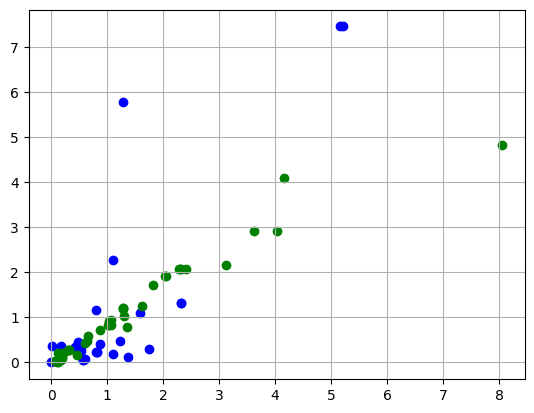

In [13]:
import matplotlib.pyplot as plt

plt.scatter(blue[:, 0], blue[:, 1], c="b")
plt.scatter(green[:, 0], green[:, 1], c="g")
plt.grid(True)

# Download cifs

In [14]:
map_icsd_to_cif = {}
# [
#     ", ".join([e for e in list(shg_cm_unique.keys())[k : k + 25]])
#     for k in range(0, len(shg_cm_unique) + 25, 25)
# ]

In [15]:
# ", ".join([e for e in shg_am_unique.keys()])

In [16]:
if False:
    with MPRester(os.environ["MP_API_KEY"]) as mpr:
        mp_docs = mpr.materials.summary.search(fields=["material_id", "database_IDs"])

    # icsd_to_mpid = {}
    mpid_to_icsd = {}

    for mp_doc in mp_docs:
        mpid = int(str(mp_doc.material_id).replace("mp-", "").replace("mvc-", ""))
        mpid_to_icsd[mpid] = []
        for icsd_id in mp_doc.database_IDs.get("icsd", []):
            icsdid = int(icsd_id.replace("icsd-", ""))
            mpid_to_icsd[mpid].append(icsdid)
            # if icsd_id not in icsd_to_mpid:
            #     icsd_to_mpid[icsd_id] = []
            # icsd_to_mpid[icsd_id].append(mpid)
    with open("tmp_mpid_to_icsd.pkl", "wb") as f:
        pickle.dump(mpid_to_icsd, f)
    len(mpid_to_icsd), mpid_to_icsd

In [17]:
with open("tmp_mpid_to_icsd.pkl", "rb") as f:
    mpid_to_icsd = pickle.load(f)

In [18]:
len(mpid_to_icsd)

178577

In [19]:
icsd_to_mpid = {}

In [20]:
for mp, icsds in mpid_to_icsd.items():
    for icsd_id in icsds:
        if icsd_id not in icsd_to_mpid:
            icsd_to_mpid[icsd_id] = []
        icsd_to_mpid[icsd_id].append(mp)

In [21]:
len(icsd_to_mpid)

92003

In [22]:
not_found = []
for icsd in shg_cm_unique:
    if int(icsd) not in icsd_to_mpid:
        not_found.append(icsd)
    else:
        # load cif from materials project
        with MPRester(os.environ["MP_API_KEY"]) as mpr:
            mp_id = "mp-" + str(icsd_to_mpid[int(icsd)][0])
            # print(mp_id, icsd_to_mpid[int(icsd)])
            structure: Structure = mpr.get_structure_by_material_id(mp_id)
            map_icsd_to_cif[int(icsd)] = structure.as_dict()

not_found, len(shg_cm_unique), len(not_found)

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

(['409663',
  '255774',
  '244721',
  '433331',
  '20662',
  '200264',
  '254161',
  '254160',
  '433805',
  '431892',
  '433804',
  '421260',
  '16178',
  '426915',
  '4225',
  '18211',
  '431863',
  '254205',
  '255766',
  '172480',
  '253696',
  '253012',
  '427409',
  '263515',
  '249471',
  '187776',
  '164632',
  '243887',
  '245016',
  '253442',
  '431283',
  '244334',
  '173746',
  '245017',
  '239631',
  '401681',
  '89423',
  '247762',
  '4493',
  '59277',
  '253695',
  '243885',
  '432925',
  '260309',
  '244344',
  '36431',
  '244343',
  '244340',
  '291434',
  '418092',
  '258580',
  '244134',
  '4481',
  '258333',
  '431201',
  '244341',
  '154105',
  '243671',
  '255442',
  '260440',
  '155156',
  '260439',
  '164854',
  '432664',
  '431106',
  '164855',
  '253356',
  '167112',
  '428001',
  '432814',
  '264388',
  '255782',
  '255783',
  '263469',
  '242177',
  '426601',
  '244202',
  '244133'],
 248,
 78)

In [23]:
not_found = []
for icsd in shg_am_unique:
    if int(icsd) not in icsd_to_mpid:
        not_found.append(icsd)
    else:
        # load cif from materials project
        with MPRester(os.environ["MP_API_KEY"]) as mpr:
            mp_id = "mp-" + str(icsd_to_mpid[int(icsd)][0])
            structure: Structure = mpr.get_structure_by_material_id(mp_id)
            map_icsd_to_cif[int(icsd)] = structure.as_dict()
not_found, len(shg_am_unique), len(not_found)

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

Retrieving MaterialsDoc documents:   0%|          | 0/1 [00:00<?, ?it/s]

(['39133',
  '250160',
  '257741',
  '166629',
  '4013',
  '243552',
  '28213',
  '200614',
  '97016',
  '254192',
  '431201',
  '254193',
  '161260',
  '28178',
  '62488'],
 100,
 15)

In [24]:
with open("cile1.cif") as f:
    res = [e[e.find("\n") + 1 :] for e in ("a\n" + f.read()).split("#")]
structs_1 = {}
for s in res:
    try:
        k = int(s[5 : s.find("-ICSD")])
        structs_1[k] = Structure.from_str(s, fmt="cif")
        map_icsd_to_cif[k] = structs_1[k].as_dict()
    except Exception as e:
        print(e)

zip() argument 2 is longer than argument 1
invalid literal for int() with base 10: ''


In [25]:
len(structs_1)

9

In [26]:
structs_1

{4013: Structure Summary
 Lattice
     abc : 26.238000000000003 6.623 12.969
  angles : 90.0 106.20000000000002 90.0
  volume : 2164.193290239121
       A : 25.196185724791633 0.0 -7.320168640257299
       B : 1.0650596308808362e-15 6.623 4.05541787537646e-16
       C : 0.0 0.0 12.969
     pbc : True True True
 PeriodicSite: Co1 (Co0+) (12.52, 3.508, 8.812) [0.4969, 0.5296, 0.9599]
 PeriodicSite: Co1 (Co0+) (12.52, 3.115, 2.327) [0.4969, 0.4704, 0.4599]
 PeriodicSite: Co1 (Co0+) (25.12, 0.196, 5.151) [0.9969, 0.0296, 0.9599]
 PeriodicSite: Co1 (Co0+) (25.12, 6.427, -1.333) [0.9969, 0.9704, 0.4599]
 PeriodicSite: Co2 (Co0+) (6.241, 5.276, 7.373) [0.2477, 0.7966, 0.7083]
 PeriodicSite: Co2 (Co0+) (6.241, 1.347, 0.8882) [0.2477, 0.2034, 0.2083]
 PeriodicSite: Co2 (Co0+) (18.84, 1.964, 3.713) [0.7477, 0.2966, 0.7083]
 PeriodicSite: Co2 (Co0+) (18.84, 4.659, -2.772) [0.7477, 0.7034, 0.2083]
 PeriodicSite: Ge1 (Ge0+) (14.13, 2.467, 7.544) [0.5608, 0.3725, 0.8982]
 PeriodicSite: Ge1 (Ge0+) (1

In [27]:
with open("cile2.cif") as f:
    res = [e[e.find("\n") + 1 :] for e in ("a\n" + f.read()).split("#")]
structs_2 = {}
for s in res:
    try:
        k = int(s[5 : s.find("-ICSD")])
        structs_2[k] = Structure.from_str(s, fmt="cif")
        map_icsd_to_cif[k] = structs_2[k].as_dict()
    except Exception as e:
        print(e)

/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1304: UserWarning: Issues encountered while parsing CIF: 6 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1238: UserWarning: Incorrect stoichiometry:
  CIF={'B': 3.0, 'Ba': 3.0, 'F': 5.0, 'O': 9.0, 'Sr': 4.0}
  PMG={'Ba': 6.0, 'Sr': 8.0, 'B': 12.0, 'O': 18.0, 'F': 10.0}
  ratios={'O': 2.0, 'Ba': 2.0, 'Sr': 2.0, 'F': 2.0, 'B': 4.0}
  warnings.warn(cif_failure_reason)
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1304: UserWarning: Issues encountered while parsing CIF: 4 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))
/home/xormap/miniconda3/envs/mof/l

len(items)=86 is not a multiple of n=9
invalid literal for int() with base 10: ''


/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1304: UserWarning: Issues encountered while parsing CIF: 7 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1304: UserWarning: Issues encountered while parsing CIF: 3 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1238: UserWarning: Incorrect stoichiometry:
  CIF={'B': 1.0, 'Be': 2.0, 'Cs': 1.0, 'F': 2.0, 'O': 3.0}
  PMG={'Cs': 3.0, 'Be': 6.0, 'B': 3.0, 'O': 15.0, 'F': 6.0}
  ratios={'O': 5.0, 'B': 3.0, 'Cs': 3.0, 'F': 3.0, 'Be': 3.0}
  warnings.warn(cif_failure_reason)


In [28]:
len(structs_2)

23

In [29]:
structs_2

{4225: Structure Summary
 Lattice
     abc : 10.061 4.536 14.865
  angles : 90.0 90.0 90.0
  volume : 678.38948604
       A : 10.061 0.0 6.160585723110761e-16
       B : 7.294444338933222e-16 4.536 2.777498940466197e-16
       C : 0.0 0.0 14.865
     pbc : True True True
 PeriodicSite: Mg1 (Mg2+) (6.509, 2.313, 0.773) [0.647, 0.51, 0.052]
 PeriodicSite: Mg1 (Mg2+) (3.552, 2.223, 8.205) [0.353, 0.49, 0.552]
 PeriodicSite: Mg1 (Mg2+) (8.582, 0.04536, 8.205) [0.853, 0.01, 0.552]
 PeriodicSite: Mg1 (Mg2+) (1.479, 4.491, 0.773) [0.147, 0.99, 0.052]
 PeriodicSite: Mg2 (Mg2+) (9.246, 2.268, 2.2) [0.919, 0.5, 0.148]
 PeriodicSite: Mg2 (Mg2+) (0.8149, 2.268, 9.633) [0.081, 0.5, 0.648]
 PeriodicSite: Mg2 (Mg2+) (5.845, 0.0, 9.633) [0.581, 0.0, 0.648]
 PeriodicSite: Mg2 (Mg2+) (4.216, 0.0, 2.2) [0.419, 0.0, 0.148]
 PeriodicSite: Mg3 (Mg2+) (6.59, 2.295, 3.746) [0.655, 0.506, 0.252]
 PeriodicSite: Mg3 (Mg2+) (3.471, 2.241, 11.18) [0.345, 0.494, 0.752]
 PeriodicSite: Mg3 (Mg2+) (8.502, 0.02722, 11.

In [30]:
c = 0
for icsd in shg_cm_unique:
    if int(icsd) not in icsd_to_mpid and int(icsd) not in structs_2:
        print(icsd)
        c += 1
c, len(shg_cm_unique)

255774
244721
433331
254161
254160
433805
431892
433804
421260
426915
431863
254205
255766
253696
253012
427409
263515
187776
243887
253442
431283
244334
239631
247762
4493
253695
243885
432925
244344
244343
244340
291434
418092
258580
244134
4481
258333
431201
244341
243671
255442
432664
431106
253356
167112
428001
432814
264388
255782
255783
263469
242177
426601
244202
244133


(55, 248)

In [31]:
c = 0
for icsd in shg_am_unique:
    if int(icsd) not in icsd_to_mpid and int(icsd) not in structs_1:
        print(icsd)
        c += 1
c, len(shg_am_unique)

257741
243552
254192
431201
254193
62488


(6, 100)

In [32]:
ccdc2icsd = {
    1545375: 254192,
    # 1790487: 431201,
    1545376: 254193,
    1625722: 62488,
    1928459: 257741,
    1882974: 432925,
    1779421: 418092,
    1723532: 291434,
    1929259: 258580,
    1926527: 243885,
    1563595: 244134,
    1528693: 253695,
    1540436: 4493,
    1576449: 244344,
    1576448: 244343,
    1576445: 244340,
    1508017: 253012,
    1559886: 255774,
    1556105: 254205,
    1576439: 244334,
    1528692: 253696,
    1582735: 244721,
    832328: 421260,
    1696846: 187776,
    1009909: 239631,
    1926529: 253442,
    1530601: 254160,
    1530602: 254161,
    1816121: 255766,
    1930358: 263515,
    1050417: 426915,
    1736978: 427409,
    1790558: 431283,
    1791000: 431863,
    1791024: 431892,
    1557306: 433331,
    1900986: 433804,
    1900990: 433805,
    1842516: 4481,
    1583358: 255442,
    1576446: 244341,
    1504981: 242177,
    794442: 167112,
    1541314: 431106,
    1563594: 244133,
    1789750: 243671,
    1448410: 244202,
    1471636: 253356,
    1927753: 255782,
    1927754: 255783,
    1825301: 258333,
    1819130: 263469,
    1826239: 264388,
    1014909: 426601,
    1737254: 428001,
    1790487: 431201,
    1791624: 432664,
    1791745: 432814,
    1791746: 432819,
    1714367: 247762,
}

In [33]:
len(
    [
        255774,
        244721,
        433331,
        254161,
        254160,
        433805,
        431892,
        433804,
        421260,
        426915,
        431863,
        254205,
        255766,
        253696,
        253012,
        427409,
        263515,
        187776,
        243887,
        253442,
        431283,
        244334,
        239631,
        247762,
    ]
), len(
    [
        4493,
        253695,
        243885,
        432925,
        244344,
        244343,
        244340,
        291434,
        418092,
        258580,
        244134,
    ]
), len(
    [
        4481,
        258333,
        431201,
        244341,
        243671,
        255442,
        432664,
        431106,
        253356,
        167112,
        428001,
        432814,
        264388,
        255782,
        255783,
        263469,
        242177,
        426601,
        244202,
        244133,
    ]
)

(24, 11, 20)

In [34]:
# mol to cif:
# am
# 1929259,243552,1926527
# cm
# 1927753: 255782,
# 1927754: 255783

In [35]:
directory = "./am_cifs"
filenames = os.listdir(directory)
for filename in filenames:
    with open(directory + "/" + filename) as f:
        s = f.read().split("\ndata_")[1:]
        for c in s:
            cif = "data_" + c
            structure = Structure.from_str(cif, fmt="cif")
            ccdc_idx = cif.find("'", cif.find("_database_code_depnum_ccdc_archive"))
            ccdc = cif[ccdc_idx + 1 : cif.find("'", ccdc_idx + 1)].replace("CCDC ", "")
            map_icsd_to_cif[ccdc2icsd[int(ccdc)]] = structure.as_dict()

In [36]:
directory = "./cm_cifs"
filenames = os.listdir(directory)
for filename in filenames:
    with open(directory + "/" + filename) as f:
        s = f.read().split("\ndata_")[1:]
        for c in s:
            cif = "data_" + c
            try:
                structure = Structure.from_str(cif, fmt="cif")
                ccdc_idx = cif.find("'", cif.find("_database_code_depnum_ccdc_archive"))
                ccdc = cif[ccdc_idx + 1 : cif.find("'", ccdc_idx + 1)].replace(
                    "CCDC ", ""
                )
                map_icsd_to_cif[ccdc2icsd[int(ccdc)]] = structure.as_dict()
            except Exception as e:
                print(e)

/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1304: UserWarning: Issues encountered while parsing CIF: 14 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1304: UserWarning: Issues encountered while parsing CIF: 2 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:821: UserWarning: No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
  warnings.warn(msg)
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1300: UserWarning: No structure parsed for section 1 in CIF.
'_atom_site_label'
  warnings.warn(msg)
/home/xorma

Invalid CIF file with no structures!


/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1238: UserWarning: Incorrect stoichiometry:
  CIF={'B': 4.0, 'Na': 3.0, 'O': 12.0, 'Y': 3.0}
  PMG={'Na': 12.0, 'Y': 6.0, 'B': 8.0, 'O': 24.0}
  ratios={'O': 2.0, 'Y': 2.0, 'Na': 4.0, 'B': 2.0}
  warnings.warn(cif_failure_reason)


1522447


/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1304: UserWarning: Issues encountered while parsing CIF: 1 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1304: UserWarning: Issues encountered while parsing CIF: 12 fractional coordinates rounded to ideal values to avoid issues with finite precision.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))


could not convert string to float: '?'
Invalid CIF file with no structures!
Invalid CIF file with no structures!
len(items)=11950 is not a multiple of n=1493


/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1238: UserWarning: Incorrect stoichiometry:
  CIF={'B': 18.0, 'Ba': 4.0, 'H': 30.0, 'O': 46.0}
  PMG={'Ba': 4.0, 'B': 18.0, 'H': 28.0, 'O': 46.0}
  ratios={'Ba': 1.0, 'O': 1.0, 'B': 1.0, 'H': 0.9333333333333333}
  warnings.warn(cif_failure_reason)


Invalid CIF file with no structures!


/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1238: UserWarning: Incorrect stoichiometry:
  CIF={'B': 6.0, 'Br': 1.0, 'K': 3.0, 'O': 10.0}
  PMG={'K': 9.0, 'B': 20.0, 'Br': 3.0, 'O': 30.0}
  ratios={'K': 3.0, 'O': 3.0, 'Br': 3.0, 'B': 3.3333333333333335}
  warnings.warn(cif_failure_reason)


Invalid CIF file with no structures!


In [37]:
c = 0
for icsd in shg_am_unique | shg_cm_unique:
    if (
        int(icsd) not in icsd_to_mpid
        and int(icsd) not in structs_1
        and int(icsd) not in structs_2
        and int(icsd) not in map_icsd_to_cif
    ):
        print(icsd)
        c += 1

243552
243887
253442
4493
243885
258580
255782
255783


In [38]:
directory = "./amcm_mol"
filenames = os.listdir(directory)
for filename in filenames:
    if ".cif" in filename:
        with open(directory + "/" + filename) as f:
            ccdc = int(filename.replace(".cif", ""))
            cif = f.read()
            try:
                structure = Structure.from_str(cif, fmt="cif")
                map_icsd_to_cif[ccdc2icsd[ccdc]] = structure.as_dict()
            except Exception as e:
                print(e)

Invalid CIF file with no structures!
Invalid CIF file with no structures!


/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1300: UserWarning: No structure parsed for section 1 in CIF.
cannot reshape array of size 1 into shape (3,3)
  warnings.warn(msg)
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1304: UserWarning: Issues encountered while parsing CIF: No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
No structure parsed for section 1 in CIF.
cannot reshape array of size 1 into shape (3,3)
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))


Invalid CIF file with no structures!
Invalid CIF file with no structures!
Invalid CIF file with no structures!


/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1094: UserWarning: Some occupancies ([3.0]) sum to > 1! If they are within the occupancy_tolerance, they will be rescaled. The current occupancy_tolerance is set to: 1.0
  warnings.warn(msg)
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1300: UserWarning: No structure parsed for section 1 in CIF.
Occupancy 3.0 exceeded tolerance.
  warnings.warn(msg)
/home/xormap/miniconda3/envs/mof/lib/python3.10/site-packages/pymatgen/io/cif.py:1304: UserWarning: Issues encountered while parsing CIF: No _symmetry_equiv_pos_as_xyz type key found. Defaulting to P1.
Some occupancies ([3.0]) sum to > 1! If they are within the occupancy_tolerance, they will be rescaled. The current occupancy_tolerance is set to: 1.0
No structure parsed for section 1 in CIF.
Occupancy 3.0 exceeded tolerance.
  warnings.warn("Issues encountered while parsing CIF: " + "\n".join(self.warnings))


In [39]:
shg_amcm_unique = shg_am_unique | shg_cm_unique
len(shg_amcm_unique)

341

In [40]:
len(map_icsd_to_cif)

334

In [41]:
# icsd2ccdc = {v: k for k, v in ccdc2icsd.items()}

In [44]:
amcm_dataset = {}
for icsd, structure in map_icsd_to_cif.items():
    # print(icsd)
    try:
        shg_tensor = dict(
            dinf={k: {"value": e / 2} for k, e in shg_amcm_unique[str(icsd)].items()}
        )
        # shg_tensor =
        # shg=tensor2scalar(dict2tensor(v["data"]["data"])),

        amcm_dataset["icsd-" + str(icsd)] = dict(
            structure=structure, data=dict(data=shg_tensor)
        )
    except:
        print(icsd)
len(amcm_dataset), amcm_dataset

432819


(333,
 {'icsd-150328': {'structure': {'@module': 'pymatgen.core.structure',
    '@class': 'Structure',
    'charge': 0,
    'lattice': {'matrix': [[2.800027, -4.849788, 0.0],
      [2.800027, 4.849788, 0.0],
      [0.0, 0.0, 14.900466]],
     'pbc': (True, True, True),
     'a': 5.600053110968949,
     'b': 5.600053110968949,
     'c': 14.900466,
     'alpha': 90.0,
     'beta': 90.0,
     'gamma': 119.99998949691704,
     'volume': 404.6828689882297},
    'properties': {},
    'sites': [{'species': [{'element': 'Ba', 'occu': 1}],
      'abc': [0.0, 0.0, 0.720441999999999],
      'properties': {'magmom': 0.0},
      'label': 'Ba',
      'xyz': [0.0, 0.0, 10.734921525971986]},
     {'species': [{'element': 'Ba', 'occu': 1}],
      'abc': [0.333333, 0.666667, 0.382554],
      'properties': {'magmom': 0.0},
      'label': 'Ba',
      'xyz': [2.800027, 1.616599233192, 5.700232870164]},
     {'species': [{'element': 'Ba', 'occu': 1}],
      'abc': [0.0, 0.0, 0.220442],
      'properties': {

In [45]:
with open("amcm.json", "wb") as f:
    f.write(json.dumps(amcm_dataset, option=json.OPT_SERIALIZE_NUMPY))